# Clustering  of ceramic samples by chemical composition

Notebook created by **Manuel David Soto** with a dataset from: 

https://archive.ics.uci.edu/ml/datasets/Chemical+Composition+of+Ceramic+Samples

The dataset was provided by Ziyang He, Department of Industrial and Manufacturing System Engineering, Iowa State University, who published the following article on this mater: 

    He, Z., Zhang, M., & Zhang, H. (2016). Data-driven research on chemical features of Jingdezhen and Longquan celadon by energy dispersive X-ray fluorescence. Ceramics International, 42(4), 5123-5129.

<br>

<img src="NB_images\longquan.jpg" style="width:300px" align="center">

<br>

Information on Chinese ceramic and the image at:https://en.wikipedia.org/wiki/Chinese_ceramics

# Objective

The objective of this notebook is to generate a classification system for samples of Longquan and Jindgezhen Chinese ceramic. The samples, body or glaze, were analyzed by energy dispersive X-ray fluorescence (EDXRF) which provides chemical compositions based on weight percentage or ppm of major and minor oxides.

# Data description

Here are the oxides emerging from the EDXRF analysis:

| Oxides | Unit |
| --- | --- |
| Na2O | wt % |
| MgO | wt % |
| Al2O3 | wt % |
| SiO2 | wt % |
| K2O | wt % |
| CaO | wt % |
| TiO2 | wt % |
| Fe2O3 | wt % |
| MnO |ppm |
| CuO |ppm |
| ZnO | ppm |
| PbO2 | ppm |
| Rb2O | ppm |
| SrO | ppm |
| Y2O3 | ppm |
| ZrO2 | ppm |
| P2O5 | ppm |

# Loading libraries

In [1]:
# Basic libraries

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# EDA

from ydata_profiling import ProfileReport

# Data selection or transformation

from sklearn.decomposition import PCA

# Clustering

from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

In [2]:
# Setting a seed for random processes

seed = 12345
sns.set_style('darkgrid')

# Loading data

In [3]:
# A negative sign in the SrO oxide was eliminated in the original data 

df = pd.read_csv('Data\Ceramic_analysis_mod.csv')
df

,Ceramic Name,Part,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
0,FLQ-1-b,Body,0.62,0.38,19.61,71.99,4.84,0.31,0.07,1.18,630,10,70,10,430,0,40,80,90
1,FLQ-2-b,Body,0.57,0.47,21.19,70.09,4.98,0.49,0.09,1.12,380,20,80,40,430,10,40,100,110
2,FLQ-3-b,Body,0.49,0.19,18.60,74.70,3.47,0.43,0.06,1.07,420,20,50,50,380,40,40,80,200
3,FLQ-4-b,Body,0.89,0.30,18.01,74.19,4.01,0.27,0.09,1.23,460,20,70,60,380,10,40,70,210
4,FLQ-5-b,Body,0.03,0.36,18.41,73.99,4.33,0.65,0.05,1.19,380,40,90,40,360,10,30,80,150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,DY-M-3-g,Glaze,0.34,0.55,12.37,70.70,5.33,8.06,0.06,1.61,1250,10,90,30,250,520,30,140,690
84,DY-QC-1-g,Glaze,0.72,0.34,12.20,72.19,6.19,6.06,0.04,1.27,1700,60,110,10,270,540,40,120,630
85,DY-QC-2-g,Glaze,0.23,0.24,12.99,71.81,5.25,7.15,0.05,1.29,750,40,100,0,240,470,40,120,480
86,DY-QC-3-g,Glaze,0.14,0.46,12.62,69.16,4.34,11.03,0.05,1.20,920,40,90,20,230,470,40,130,1100


In order ti compare all oxides is worthy to convert ppm to weight % (10,000 ppm is equivalent to 1% in weight). After the convertion is clear that beyond Fe2O3 (serie 9) the oxides are present in minor amounts or almost traces.

In [4]:
ppm = df.columns[10:]
df[ppm] = df[ppm].div(10000)
df

,Ceramic Name,Part,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
0,FLQ-1-b,Body,0.62,0.38,19.61,71.99,4.84,0.31,0.07,1.18,0.063,0.001,0.007,0.001,0.043,0.000,0.004,0.008,0.009
1,FLQ-2-b,Body,0.57,0.47,21.19,70.09,4.98,0.49,0.09,1.12,0.038,0.002,0.008,0.004,0.043,0.001,0.004,0.010,0.011
2,FLQ-3-b,Body,0.49,0.19,18.60,74.70,3.47,0.43,0.06,1.07,0.042,0.002,0.005,0.005,0.038,0.004,0.004,0.008,0.020
3,FLQ-4-b,Body,0.89,0.30,18.01,74.19,4.01,0.27,0.09,1.23,0.046,0.002,0.007,0.006,0.038,0.001,0.004,0.007,0.021
4,FLQ-5-b,Body,0.03,0.36,18.41,73.99,4.33,0.65,0.05,1.19,0.038,0.004,0.009,0.004,0.036,0.001,0.003,0.008,0.015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,DY-M-3-g,Glaze,0.34,0.55,12.37,70.70,5.33,8.06,0.06,1.61,0.125,0.001,0.009,0.003,0.025,0.052,0.003,0.014,0.069
84,DY-QC-1-g,Glaze,0.72,0.34,12.20,72.19,6.19,6.06,0.04,1.27,0.170,0.006,0.011,0.001,0.027,0.054,0.004,0.012,0.063
85,DY-QC-2-g,Glaze,0.23,0.24,12.99,71.81,5.25,7.15,0.05,1.29,0.075,0.004,0.010,0.000,0.024,0.047,0.004,0.012,0.048
86,DY-QC-3-g,Glaze,0.14,0.46,12.62,69.16,4.34,11.03,0.05,1.20,0.092,0.004,0.009,0.002,0.023,0.047,0.004,0.013,0.110


# EDA

In general, it is a simple dataset, with only two categorical variables, 17 numerical, no null values, neither repeated rows. 

The fact that the samples were taken from the body and the glaze of the ceramic pieces suggests that they can be treated independently. The same piece of ceramic can be glazed in many ways and with very different oxides. For this reason, the dataframe was separated into body and glaze. 

The independence of these two groups is proved by, the large differences in the histograms and box plots of certain oxides (Al2O3, CaO, MnO, SrO, P2O5), and by the different correlative pairs in each group (correlation of SrO and ZrO in the glaze is 0.83 while in the body is 0.032).

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88 entries, 0 to 87
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ceramic Name  88 non-null     object 
 1   Part          88 non-null     object 
 2   Na2O          88 non-null     float64
 3   MgO           88 non-null     float64
 4   Al2O3         88 non-null     float64
 5   SiO2          88 non-null     float64
 6   K2O           88 non-null     float64
 7   CaO           88 non-null     float64
 8   TiO2          88 non-null     float64
 9   Fe2O3         88 non-null     float64
 10  MnO           88 non-null     float64
 11  CuO           88 non-null     float64
 12  ZnO           88 non-null     float64
 13  PbO2          88 non-null     float64
 14  Rb2O          88 non-null     float64
 15  SrO           88 non-null     float64
 16  Y2O3          88 non-null     float64
 17  ZrO2          88 non-null     float64
 18  P2O5          88 non-null     fl

In [6]:
df.describe()

,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
count,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.00000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000
mean,0.471705,0.430114,17.460909,69.825114,4.978409,4.171818,0.10125,1.561591,0.081875,0.003091,0.009534,0.003852,0.031045,0.022909,0.004295,0.014545,0.044091
std,0.348779,0.215030,4.703422,2.754377,0.879467,4.305801,0.05343,0.604276,0.061424,0.001910,0.003390,0.002659,0.006981,0.025601,0.001288,0.006007,0.040265
min,0.030000,0.070000,11.300000,63.880000,2.730000,0.120000,0.04000,0.580000,0.018000,0.000000,0.002000,0.000000,0.018000,0.000000,0.002000,0.005000,0.005000
25%,0.247500,0.270000,13.007500,67.737500,4.337500,0.180000,0.07000,1.097500,0.038000,0.002000,0.007000,0.002000,0.025000,0.001000,0.003000,0.010000,0.009750
50%,0.375000,0.405000,16.205000,69.990000,5.065000,2.690000,0.08000,1.510000,0.059000,0.003000,0.009000,0.003000,0.032000,0.007500,0.004000,0.014000,0.036500
75%,0.642500,0.530000,21.707500,71.840000,5.590000,7.912500,0.13000,1.925000,0.098250,0.004000,0.011250,0.006000,0.037000,0.048250,0.005000,0.017000,0.069750
max,1.880000,1.320000,26.480000,75.950000,6.740000,13.690000,0.29000,3.110000,0.297000,0.008000,0.023000,0.010000,0.045000,0.078000,0.008000,0.039000,0.161000


In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
%matplotlib inline

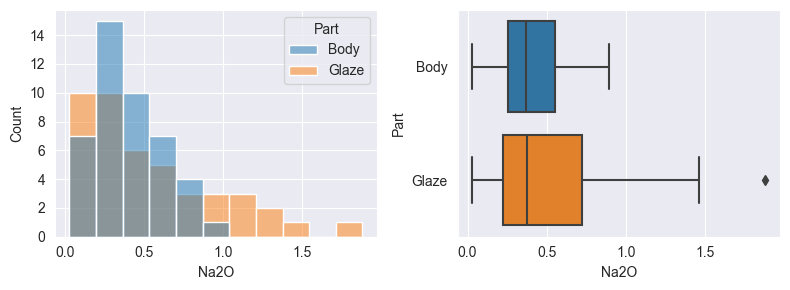

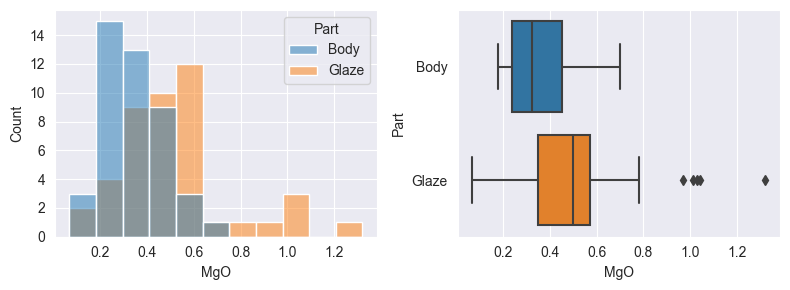

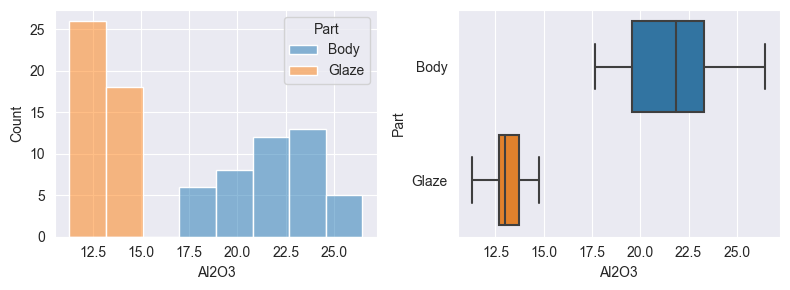

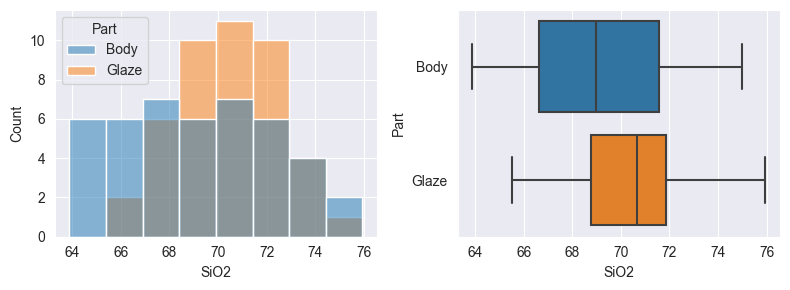

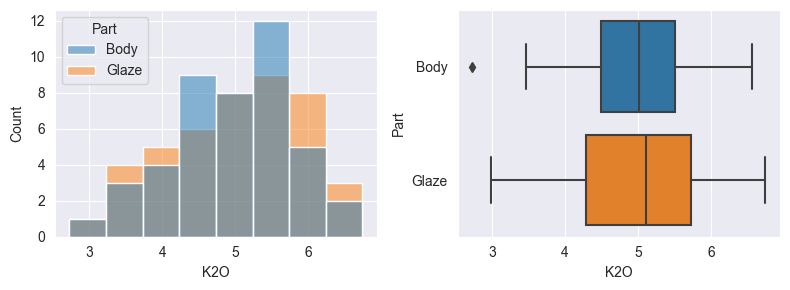

...

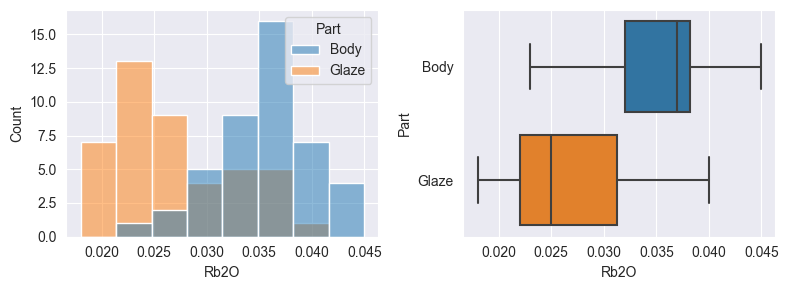

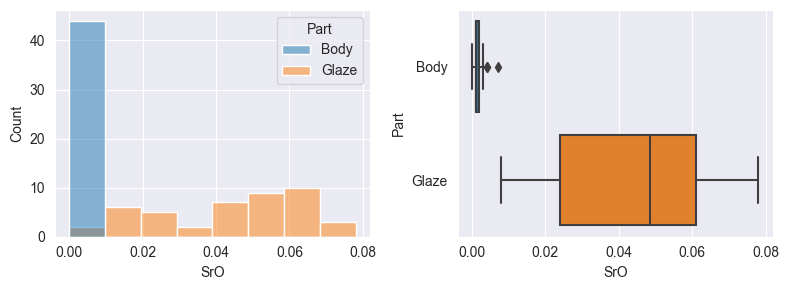

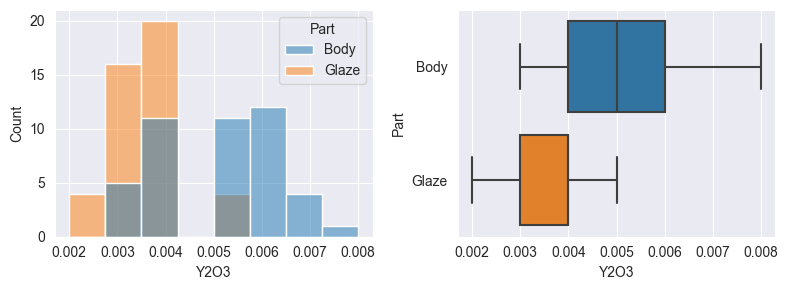

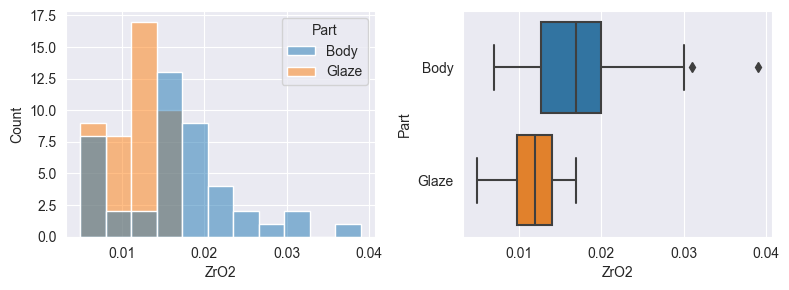

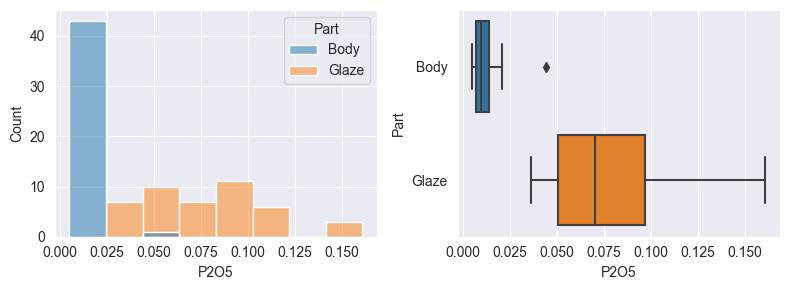

In [9]:
# Histogram and box plots

features = df.iloc[:, 2:19]

for feature in features :
    plt.figure(figsize=(8,3))
    plt.subplot(121)
    sns.histplot(data=df, x=feature, hue='Part')
    plt.subplot(122)
    sns.boxplot(data=df, x=feature, y='Part')
    plt.tight_layout()
    plt.show()

In [10]:
# New dataframes

body = df[df.Part =='Body']
glaze = df[df.Part =='Glaze']

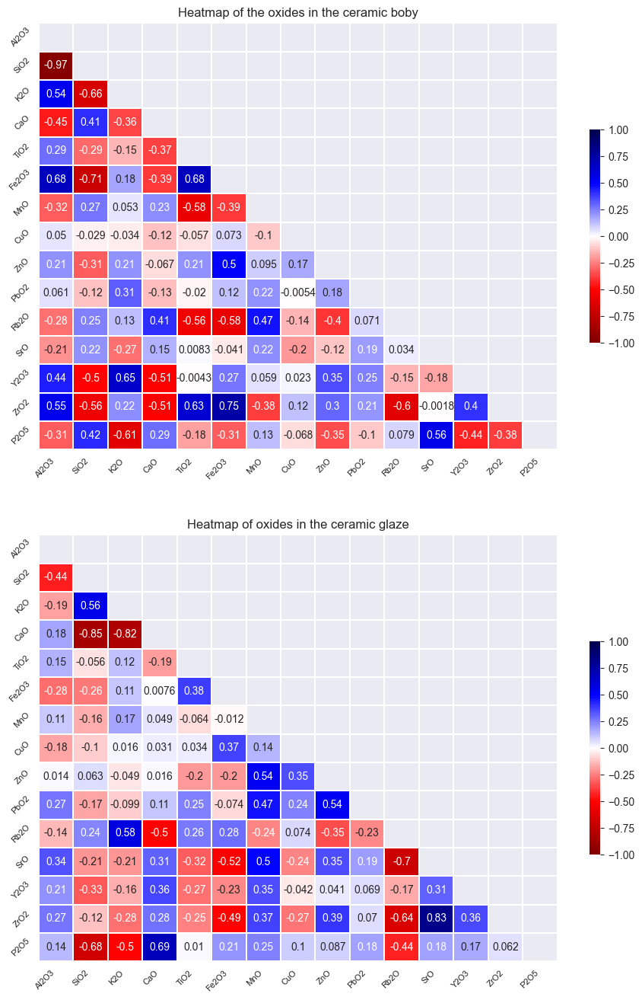

In [53]:
# All against all correlation matrix by Seaborn´s heatmap function

plt.figure(figsize=(11,16))

plt.subplot(211)
correl_body = body.iloc[:,2:].corr()
mask = np.triu(np.ones_like(correl_body))
sns.heatmap(correl_body, vmin=-1, vmax=1, center=0, linewidths=.2, cmap='seismic_r', annot=True, mask=mask, cbar_kws={"shrink": .5})
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=45, ha='right', fontsize=8)
plt.title('Heatmap of the oxides in the ceramic boby')
            
plt.subplot(212)
correl_glaze = glaze.iloc[:,2:].corr()
mask = np.triu(np.ones_like(correl_glaze))
sns.heatmap(correl_glaze, vmin=-1, vmax=1, center=0, linewidths=.2, cmap='seismic_r', annot=True, mask=mask, cbar_kws={"shrink": .5})
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=45, ha='right', fontsize=8)
plt.title('Heatmap of oxides in the ceramic glaze')
            
plt.show()

# Ceramic body

In [47]:
body.head()

,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
0,0.62,0.38,19.61,71.99,4.84,0.31,0.07,1.18,0.063,0.001,0.007,0.001,0.043,0.000,0.004,0.008,0.009
1,0.57,0.47,21.19,70.09,4.98,0.49,0.09,1.12,0.038,0.002,0.008,0.004,0.043,0.001,0.004,0.010,0.011
2,0.49,0.19,18.60,74.70,3.47,0.43,0.06,1.07,0.042,0.002,0.005,0.005,0.038,0.004,0.004,0.008,0.020
3,0.89,0.30,18.01,74.19,4.01,0.27,0.09,1.23,0.046,0.002,0.007,0.006,0.038,0.001,0.004,0.007,0.021
4,0.03,0.36,18.41,73.99,4.33,0.65,0.05,1.19,0.038,0.004,0.009,0.004,0.036,0.001,0.003,0.008,0.015


In [48]:
body.describe()

,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000
mean,0.397500,0.342273,21.812045,69.221818,4.948864,0.277273,0.122273,1.877955,0.038864,0.002818,0.009364,0.004727,0.035523,0.001591,0.005045,0.017182,0.011227
std,0.211497,0.125046,2.300711,3.088360,0.846358,0.221237,0.062724,0.583827,0.010059,0.001896,0.002070,0.002662,0.004703,0.001386,0.001257,0.006963,0.006751
min,0.030000,0.180000,17.650000,63.880000,2.730000,0.120000,0.040000,0.960000,0.018000,0.000000,0.004000,0.000000,0.023000,0.000000,0.003000,0.007000,0.005000
25%,0.257500,0.237500,19.590000,66.625000,4.490000,0.150000,0.070000,1.270000,0.032750,0.002000,0.008000,0.002750,0.032000,0.001000,0.004000,0.012750,0.007000
50%,0.370000,0.325000,21.835000,68.990000,5.005000,0.180000,0.105000,1.860000,0.038000,0.002500,0.009000,0.004500,0.037000,0.001000,0.005000,0.017000,0.009500
75%,0.552500,0.452500,23.310000,71.587500,5.500000,0.285000,0.152500,2.155000,0.042250,0.004000,0.011000,0.007000,0.038250,0.002000,0.006000,0.020000,0.014000
max,0.890000,0.700000,26.480000,74.990000,6.560000,1.260000,0.290000,3.110000,0.065000,0.008000,0.012000,0.010000,0.045000,0.007000,0.008000,0.039000,0.044000


In [14]:
# Selecting only numeric variable

body = body.iloc[:, 2:]

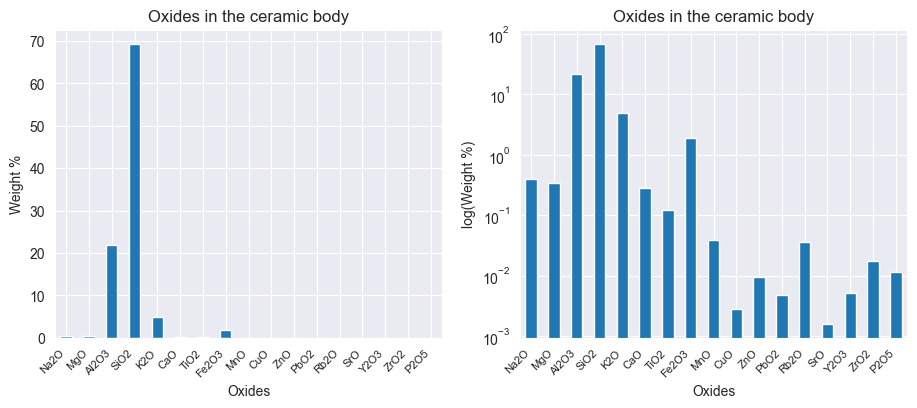

In [89]:
# Oxide abundance

plt.figure(figsize=(11,4))

plt.subplot(121)
body.mean().plot(kind='bar')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Oxides in the ceramic body')
plt.xlabel('Oxides')
plt.ylabel('Weight %')

plt.subplot(122)
body.mean().plot(kind='bar', logy=True)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Oxides in the ceramic body')
plt.xlabel('Oxides')
plt.ylabel('log(Weight %)');

## PCA

Two variables of the boby, NaO and MgO, accumulate more than 98% of the variance

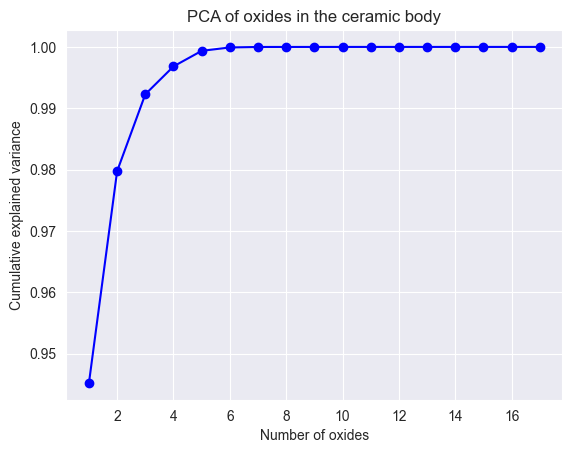

In [54]:
# Cumulative explained variance

pca = PCA()
body_pca = pca.fit(body)

explained_variance_ratio = body_pca.explained_variance_ratio_

cumulative_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Number of oxides')
plt.ylabel('Cumulative explained variance')
plt.title('PCA of oxides in the ceramic body')
plt.show()

In [58]:
# Explained variance ratio by oxide

components = body_pca.components_

top_variable_indices = np.argsort(-body_pca.explained_variance_ratio_)[:17]

top_variable_names = body.columns[top_variable_indices]

explained_variance_ratios = body_pca.explained_variance_ratio_[top_variable_indices]

print("Variables and explained variance ratio:\n")

for variable, variance_ratio in zip(top_variable_names, explained_variance_ratios):
    print(f"{variable}: {variance_ratio}")

Variables and explained variance ratio:

Na2O: 0.9452235974522661
MgO: 0.034523795947654715
Al2O3: 0.012532009338620868
SiO2: 0.004544085019943563
K2O: 0.0025365927487487993
CaO: 0.0005539030221645437
TiO2: 7.838256044743925e-05
Fe2O3: 3.513799202653647e-06
MnO: 1.3331153589122788e-06
CuO: 1.1529319891716416e-06
ZnO: 5.870847068143861e-07
PbO2: 4.4899113818688644e-07
Rb2O: 2.4351012015745527e-07
SrO: 1.8473667399755602e-07
Y2O3: 9.23581296315752e-08
ZrO2: 4.679548918578519e-08
P2O5: 3.058734523614034e-08


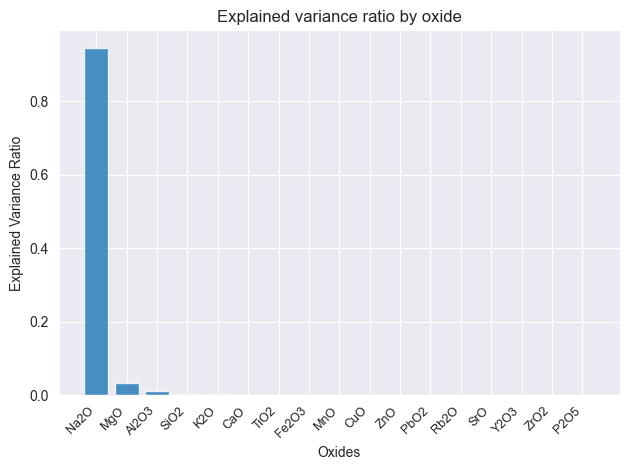

In [61]:
# Plot of explained variance ratio by oxide

variable_labels = body.columns

x_pos = np.arange(len(variable_labels))

plt.bar(variable_labels, explained_variance_ratio, align='center', alpha=0.8)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.xlabel('Oxides')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained variance ratio by oxide')
plt.tight_layout()
plt.show()

## Clustering with Na2O and MgO

In [62]:
X = body.loc[:, ['Na2O', 'MgO']]

In [63]:
# Testing different clustering algorithms

# K-means
kmeans = KMeans(n_clusters=2)
kmeans_labels = kmeans.fit_predict(X)
kmeans_silhouette = silhouette_score(X, kmeans_labels)

# Aglomerative clustering 
agg = AgglomerativeClustering(n_clusters=2)
agg_labels = agg.fit_predict(X)
agg_silhouette = silhouette_score(X, agg_labels)

# Gaussian Mixture Models (GMM)
gmm = GaussianMixture(n_components=2)
gmm_labels = gmm.fit_predict(X)
gmm_silhouette = silhouette_score(X, gmm_labels)

# Spectral Clustering
spectral = SpectralClustering(n_clusters=2)
spectral_labels = spectral.fit_predict(X)
spectral_silhouette = silhouette_score(X, spectral_labels)

print("K-means silhouette score:", kmeans_silhouette)
print("Agglomerative clustering silhouette score:", agg_silhouette)
print("GMM silhouette score:", gmm_silhouette)
print("Spectral Clustering silhouette score:", spectral_silhouette)

K-means silhouette score: 0.42714802834038823
Agglomerative clustering silhouette score: 0.4282892570774821
GMM silhouette score: 0.2886757790566004
Spectral Clustering silhouette score: 0.42714802834038823


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_in

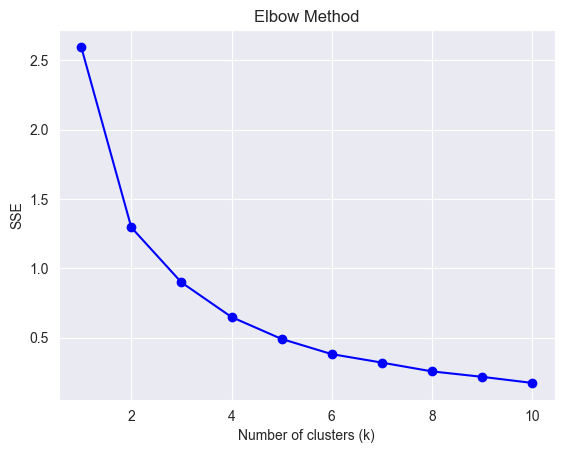

In [64]:
# Elbow Method for number of clusters

sse = []
k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)

plt.plot(k_values, sse, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [65]:
# K-means scores verification for 2 and 3 clusters

kmeans2 = KMeans(n_clusters=2)
kmeans_labels2 = kmeans2.fit_predict(X)
kmeans_silhouette2 = silhouette_score(X, kmeans_labels2)

kmeans3 = KMeans(n_clusters=3)
kmeans_labels3 = kmeans3.fit_predict(X)
kmeans_silhouette3 = silhouette_score(X, kmeans_labels3)

print('Silhouette score of 2 clusters:', kmeans_silhouette2)
print('Silhouette score of 3 clusters:', kmeans_silhouette3)

Silhouette score of 2 clusters: 0.42714802834038823
Silhouette score of 3 clusters: 0.3808000822299384


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


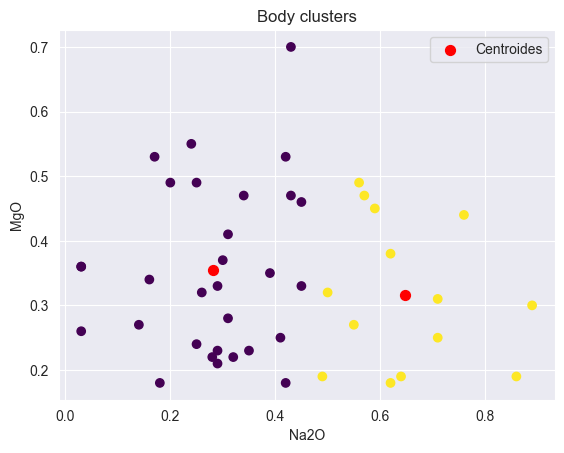

In [80]:
# Plot of the clusters

kmeans = KMeans(n_clusters=2)
kmeans.fit(X)

# labels for each point
labels = kmeans.labels_

# Points colored by labels
plt.scatter(X['Na2O'], X['MgO'], c=labels, cmap='viridis')

# Centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=50, c='red', label='Centroides')

plt.xlabel('Na2O')
plt.ylabel('MgO')
plt.title('Body clusters')
plt.legend()
plt.show()

## Alternative clustering with Al2O3 and SiO2

The reason to use these two oxides is because, apart that they are in 3rd and 4th place in the variability contribution, the are the more abundant oxides in the body.

In [24]:
X2 = body.loc[:, ['Al2O3', 'SiO2']]

In [25]:
# K-means
kmeans = KMeans(n_clusters=2)
kmeans_labels = kmeans.fit_predict(X2)
kmeans_silhouette = silhouette_score(X2, kmeans_labels)

# Aglomerative clustering 
agg = AgglomerativeClustering(n_clusters=2)
agg_labels = agg.fit_predict(X2)
agg_silhouette = silhouette_score(X2, agg_labels)

# Gaussian Mixture Models (GMM)
gmm = GaussianMixture(n_components=2)
gmm_labels = gmm.fit_predict(X2)
gmm_silhouette = silhouette_score(X2, gmm_labels)

# Spectral Clustering
spectral = SpectralClustering(n_clusters=2)
spectral_labels = spectral.fit_predict(X2)
spectral_silhouette = silhouette_score(X2, spectral_labels)

print("K-means silhouette score:", kmeans_silhouette)
print("Agglomerative clustering silhouette score:", agg_silhouette)
print("GMM silhouette score:", gmm_silhouette)
print("Spectral Clustering silhouette score:", spectral_silhouette)

K-means silhouette score: 0.5850689183426763
Agglomerative clustering silhouette score: 0.5732250289237616
GMM silhouette score: 0.5806856823157476
Spectral Clustering silhouette score: 0.5307460858818824


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_in

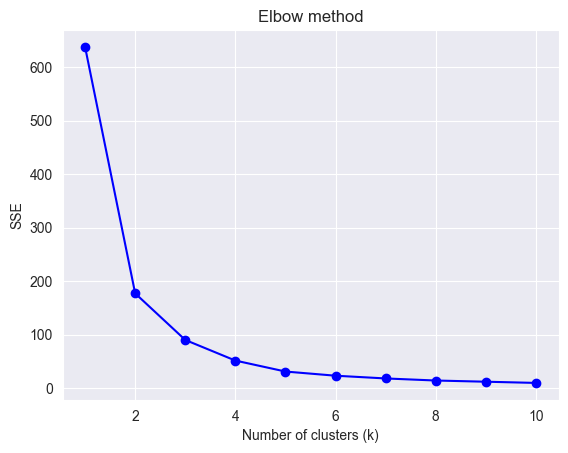

In [77]:
# Calcular SSE para diferentes valores de k

sse = []
k_values = range(1, 11)  # Probar k desde 1 hasta 10

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X2)
    sse.append(kmeans.inertia_)

plt.plot(k_values, sse, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('SSE')
plt.title('Elbow method')
plt.show()

In [27]:
# K-means scores of 2 and 3 clusters

kmeans2 = KMeans(n_clusters=2)
kmeans_labels2 = kmeans2.fit_predict(X2)
kmeans_silhouette2 = silhouette_score(X2, kmeans_labels2)

kmeans3 = KMeans(n_clusters=3)
kmeans_labels3 = kmeans3.fit_predict(X2)
kmeans_silhouette3 = silhouette_score(X2, kmeans_labels3)

print('Silhouette score of 2 clusters:', kmeans_silhouette2)
print('Silhouette score of 3 clusters:', kmeans_silhouette3)

Silhouette score of 2 clusters: 0.5850689183426763
Silhouette score of 3 clusters: 0.5308682397866235


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


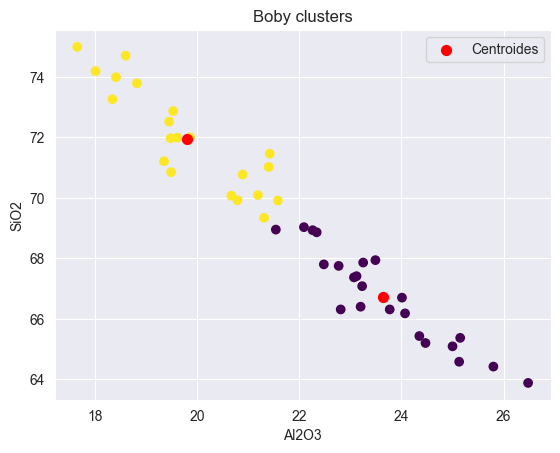

In [81]:
# Realiza el clustering utilizando K-means
kmeans = KMeans(n_clusters=2)  # Cambia el número de clusters según tu necesidad
kmeans.fit(X2)

# Asigna una etiqueta de cluster a cada punto de datos
labels = kmeans.labels_

# Obtiene los centroides de cada cluster
centroids = kmeans.cluster_centers_

# Crea un gráfico de dispersión para visualizar los puntos de datos coloreados por su etiqueta de cluster
plt.scatter(X2['Al2O3'], X2['SiO2'], c=labels, cmap='viridis')

# Agrega los centroides al gráfico como puntos marcados de manera distinta
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=50, c='red', label='Centroides')

plt.xlabel('Al2O3')
plt.ylabel('SiO2')
plt.title('Boby clusters')
plt.legend()
plt.show()

# Ceramic glaze

In [29]:
glaze.head()

,Ceramic Name,Part,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
44,FLQ-1-g,Glaze,0.97,0.07,11.42,74.41,5.70,5.34,0.05,1.04,0.055,0.002,0.006,0.002,0.031,0.015,0.002,0.005,0.039
45,FLQ-2-g,Glaze,1.46,0.47,12.96,68.79,4.85,8.88,0.11,1.49,0.095,0.003,0.004,0.000,0.035,0.025,0.003,0.006,0.084
46,FLQ-3-g,Glaze,1.05,0.23,13.64,69.90,4.46,8.43,0.07,1.22,0.059,0.002,0.009,0.004,0.037,0.009,0.004,0.008,0.046
47,FLQ-4-g,Glaze,0.14,0.41,12.42,67.24,4.29,12.86,0.06,1.58,0.096,0.008,0.007,0.004,0.033,0.016,0.004,0.007,0.100
48,FLQ-5-g,Glaze,0.37,1.03,13.15,68.98,5.58,7.91,0.08,1.90,0.080,0.006,0.012,0.000,0.032,0.008,0.004,0.008,0.108


In [30]:
glaze.describe()

,Na2O,MgO,Al2O3,SiO2,K2O,CaO,TiO2,Fe2O3,MnO,CuO,ZnO,PbO2,Rb2O,SrO,Y2O3,ZrO2,P2O5
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000
mean,0.545909,0.517955,13.109773,70.428409,5.007955,8.066364,0.080227,1.245227,0.124886,0.003364,0.009705,0.002977,0.026568,0.044227,0.003545,0.011909,0.076955
std,0.436030,0.249246,0.848653,2.250954,0.920219,2.534091,0.030613,0.439442,0.061208,0.001906,0.004349,0.002377,0.005955,0.019852,0.000791,0.003212,0.032007
min,0.030000,0.070000,11.300000,65.530000,2.980000,4.120000,0.040000,0.580000,0.052000,0.000000,0.002000,0.000000,0.018000,0.008000,0.002000,0.005000,0.036000
25%,0.222500,0.350000,12.707500,68.755000,4.285000,6.090000,0.060000,0.947500,0.079250,0.002000,0.007000,0.002000,0.022000,0.024000,0.003000,0.009750,0.050500
50%,0.375000,0.500000,13.005000,70.650000,5.105000,7.915000,0.070000,1.180000,0.100500,0.003000,0.009000,0.003000,0.025000,0.048500,0.004000,0.012000,0.070500
75%,0.722500,0.572500,13.715000,71.840000,5.720000,9.502500,0.090000,1.580000,0.162500,0.004000,0.012000,0.004000,0.031250,0.061000,0.004000,0.014000,0.096750
max,1.880000,1.320000,14.760000,75.950000,6.740000,13.690000,0.190000,2.610000,0.297000,0.008000,0.023000,0.010000,0.040000,0.078000,0.005000,0.017000,0.161000


In [31]:
glaze = glaze.iloc[:, 2:]

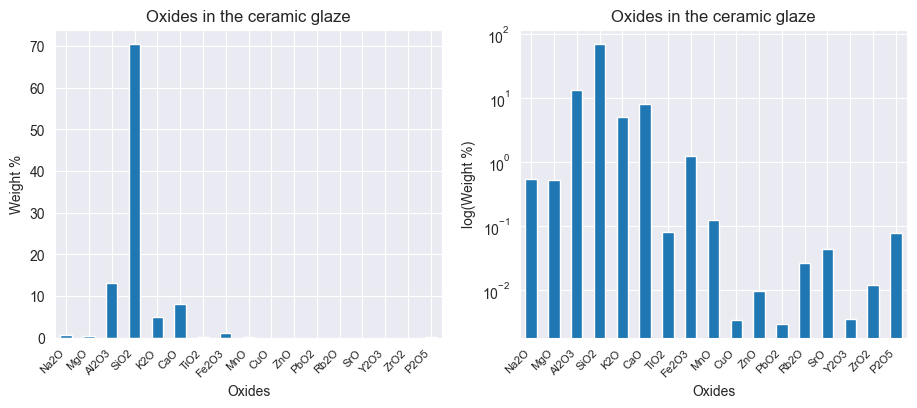

In [90]:
# Oxide abundance

plt.figure(figsize=(11,4))

plt.subplot(121)
glaze.mean().plot(kind='bar')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Oxides in the ceramic glaze')
plt.xlabel('Oxides')
plt.ylabel('Weight %')

plt.subplot(122)
glaze.mean().plot(kind='bar', logy=True)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Oxides in the ceramic glaze')
plt.xlabel('Oxides')
plt.ylabel('log(Weight %)');

## PCA

Two variables of the boby, NaO and MgO, accumulate more than 92% of the variance

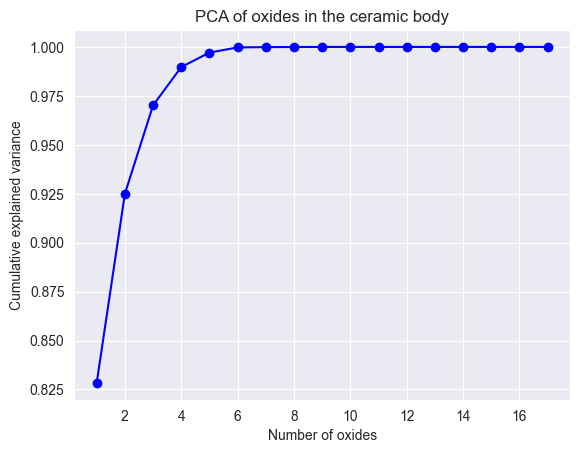

In [70]:
# Cumulative explained variance

pca = PCA()
glaze_pca = pca.fit(glaze)

# Obtener los componentes principales y la varianza explicada
explained_variance_ratio = glaze_pca.explained_variance_ratio_

# Visualizar la varianza explicada acumulada
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Number of oxides')
plt.ylabel('Cumulative explained variance')
plt.title('PCA of oxides in the ceramic body')
plt.show()

In [72]:
# Explained variance ratio by oxide

components = glaze_pca.components_

top_variable_indices = np.argsort(-glaze_pca.explained_variance_ratio_)[:17]

top_variable_names = glaze.columns[top_variable_indices]

explained_variance_ratios = glaze_pca.explained_variance_ratio_[top_variable_indices]

print("Variables and explained variance_ratio:\n")
for variable, variance_ratio in zip(top_variable_names, explained_variance_ratios):
    print(f"{variable}: {variance_ratio}")

Variables and explained variance_ratio:

Na2O: 0.8283355947592185
MgO: 0.09662189899845605
Al2O3: 0.045186763298219544
SiO2: 0.019577878323695258
K2O: 0.007377838814049718
CaO: 0.0026355583926666966
TiO2: 0.0001682232451220099
Fe2O3: 5.47223770051364e-05
MnO: 2.8344498737771776e-05
CuO: 1.0801072537245188e-05
ZnO: 1.1054273432911945e-06
PbO2: 4.95627455237579e-07
Rb2O: 3.483047639908234e-07
SrO: 1.979826750639879e-07
Y2O3: 1.2586351213355917e-07
ZrO2: 8.067503118533956e-08
P2O5: 2.2339511316092923e-08


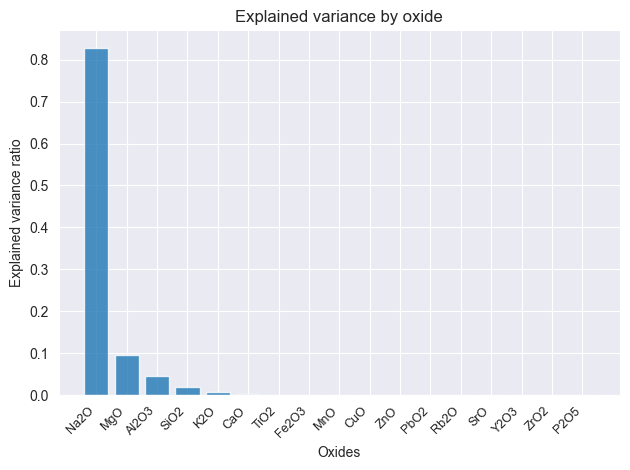

In [73]:
# Plot of explained variance ratio by oxide

variable_labels = glaze.columns

x_pos = np.arange(len(variable_labels))

plt.bar(variable_labels, explained_variance_ratio, align='center', alpha=0.8)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.xlabel('Oxides')
plt.ylabel('Explained variance ratio')
plt.title('Explained variance by oxide')
plt.tight_layout()
plt.show()

## Clustering with Na2O and MgO

In [36]:
X3 = glaze.loc[:, ['Na2O', 'MgO']]

In [37]:
# Testing different clustering algorithms

# K-means
kmeans = KMeans(n_clusters=2)
kmeans_labels = kmeans.fit_predict(X3)
kmeans_silhouette = silhouette_score(X3, kmeans_labels)

# Aglomerative clustering
agg = AgglomerativeClustering(n_clusters=2)
agg_labels = agg.fit_predict(X3)
agg_silhouette = silhouette_score(X3, agg_labels)

# Gaussian Mixture Models (GMM)
gmm = GaussianMixture(n_components=2)
gmm_labels = gmm.fit_predict(X3)
gmm_silhouette = silhouette_score(X3, gmm_labels)

# Spectral Clustering
spectral = SpectralClustering(n_clusters=2)
spectral_labels = spectral.fit_predict(X3)
spectral_silhouette = silhouette_score(X3, spectral_labels)

print("K-means silhouette score:", kmeans_silhouette)
print("Agglomerative clustering silhouette score:", agg_silhouette)
print("GMM silhouette score:", gmm_silhouette)
print("Spectral Clustering silhouette score:", spectral_silhouette)

K-means silhouette score: 0.4992012932577809
Agglomerative clustering silhouette score: 0.5335189412644602
GMM silhouette score: 0.464360920775327
Spectral Clustering silhouette score: 0.5335189412644602


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_in

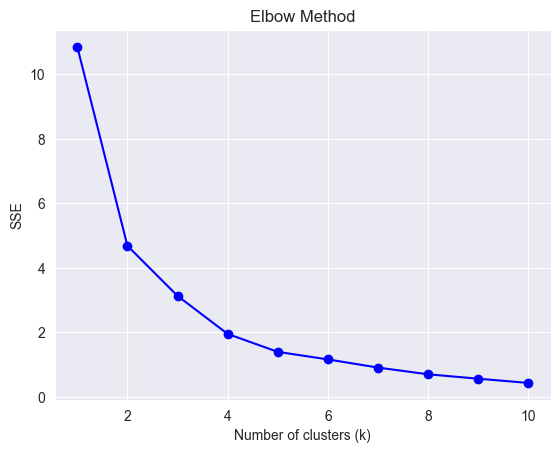

In [78]:
# Elbow Method for number of clusters

sse = []
k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X3)
    sse.append(kmeans.inertia_)

plt.plot(k_values, sse, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [75]:
# K-means scores verification for 2 and 3 clusters

kmeans2 = KMeans(n_clusters=2)
kmeans_labels2 = kmeans2.fit_predict(X3)
kmeans_silhouette2 = silhouette_score(X3, kmeans_labels2)

kmeans3 = KMeans(n_clusters=3)
kmeans_labels3 = kmeans3.fit_predict(X3)
kmeans_silhouette3 = silhouette_score(X3, kmeans_labels3)

print('Silhouette score of 2 clusters:', kmeans_silhouette2)
print('Silhouette score of 3 clusters:', kmeans_silhouette3)

Silhouette score of 2 clusters: 0.4992012932577809
Silhouette score of 3 clusters: 0.48509592373643945


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


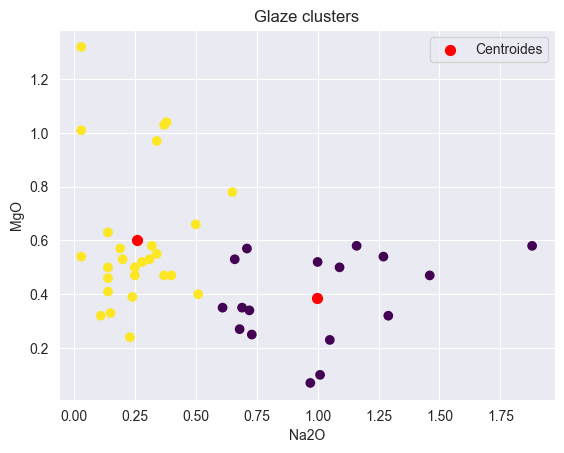

In [82]:
# Plot of the clusters

kmeans = KMeans(n_clusters=2)
kmeans.fit(X3)

# labels for each point
labels = kmeans.labels_

# Points colored by labels
plt.scatter(X3['Na2O'], X3['MgO'], c=labels, cmap='viridis')

# Centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=50, c='red', label='Centroides')

plt.xlabel('Na2O')
plt.ylabel('MgO')
plt.title('Glaze clusters')
plt.legend()
plt.show()

## Alternative clustering with Al2O3 and SiO2

The reason to use these two oxides is because, apart that they are in 3rd and 4th place in the variability contribution, the are the more abundant oxides in the body.

In [41]:
X4 = glaze.loc[:, ['Al2O3', 'SiO2']]

In [42]:
# K-means
kmeans = KMeans(n_clusters=2)
kmeans_labels = kmeans.fit_predict(X4)
kmeans_silhouette = silhouette_score(X4, kmeans_labels)

# Aglomerative clustering
agg = AgglomerativeClustering(n_clusters=2)
agg_labels = agg.fit_predict(X4)
agg_silhouette = silhouette_score(X4, agg_labels)

# Gaussian Mixture Models (GMM)
gmm = GaussianMixture(n_components=2)
gmm_labels = gmm.fit_predict(X4)
gmm_silhouette = silhouette_score(X4, gmm_labels)

# Spectral Clustering
spectral = SpectralClustering(n_clusters=2)
spectral_labels = spectral.fit_predict(X4)
spectral_silhouette = silhouette_score(X4, spectral_labels)

print("K-means silhouette score:", kmeans_silhouette)
print("Agglomerative clustering silhouette score:", agg_silhouette)
print("GMM silhouette score:", gmm_silhouette)
print("Spectral Clustering silhouette score:", spectral_silhouette)

K-means silhouette score: 0.5118508989482519
Agglomerative clustering silhouette score: 0.5186145789328264
GMM silhouette score: 0.31152523755095957
Spectral Clustering silhouette score: 0.5186145789328264


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_in

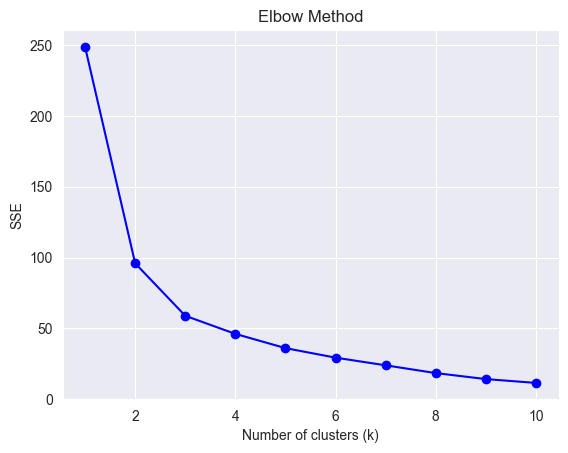

In [43]:
# Elbow Method for number of clusters

sse = []
k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X4)
    sse.append(kmeans.inertia_)

# Graficar SSE en función de k
plt.plot(k_values, sse, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [44]:
# K-means scores of 2 and 3 clusters

kmeans2 = KMeans(n_clusters=2)
kmeans_labels2 = kmeans2.fit_predict(X4)
kmeans_silhouette2 = silhouette_score(X4, kmeans_labels2)

kmeans3 = KMeans(n_clusters=3)
kmeans_labels3 = kmeans3.fit_predict(X4)
kmeans_silhouette3 = silhouette_score(X4, kmeans_labels3)

print('Silhouette score of 2 clusters:', kmeans_silhouette2)
print('Silhouette score of 3 clusters:', kmeans_silhouette3)

Silhouette score of 2 clusters: 0.5118508989482519
Silhouette score of 3 clusters: 0.4815491131009374


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


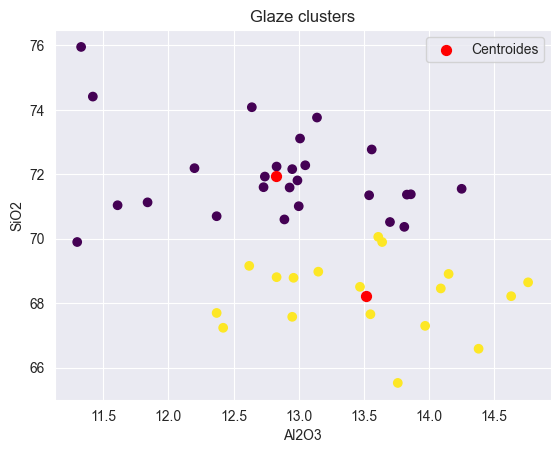

In [83]:
# Plot of clusters

kmeans = KMeans(n_clusters=2)
kmeans.fit(X4)

# labels for each point
labels = kmeans.labels_

# Points colored by labels
plt.scatter(X4['Al2O3'], X4['SiO2'], c=labels, cmap='viridis')

# Centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=50, c='red', label='Centroides')

plt.xlabel('Al2O3')
plt.ylabel('SiO2')
plt.title('Glaze clusters')
plt.legend()
plt.show()

# Conclusions

The oxides that make up the ceramic samples can be classified into major (> 0.1%, from Na2O to Fe2O3) and minor (< 0.1%, from MnO to P2O3). The correlation coefficients and the histogram-box plots of the oxides justify the separation of the data into body and glaze. In both groups, the Na2O - MgO pair contributes the greatest variability, followed by the Al2O3 - SiO2 pair, which are also the most abundant oxides. Although the K-mean does not always obtain the highest score, this algorithm was chosen for its simplicity. The scores and the elbow test for the previous pairs of oxides confirm two clusters for both the body and the glaze, been the Al2O3 - SiO2 in the glaze the clusters with better definition.